In [12]:
import xgboost
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [13]:
# load JS visualization code to notebook
shap.initjs()

In [14]:
# read the data
df = pd.read_csv('../data/total_dry_no_info.csv', index_col=0)

/home/geanderson/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (1,4,5,37) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [15]:
# delete unnamed column
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]
# convert all columns of DataFrame
df = df.dropna()
# find the objects columns
cols = df.columns[df.dtypes.eq('object')]
# convert to numeric these columns
df[cols] = df[cols].apply(pd.to_numeric, errors='coerce')

In [16]:
# dropping the columns that we do not need
df.drop('language_C', axis=1, inplace=True)
df.drop('language_C#', axis=1, inplace=True)
df.drop('language_C++', axis=1, inplace=True)
df.drop('language_CSS', axis=1, inplace=True)
df.drop('language_CoffeeScript', axis=1, inplace=True)
df.drop('language_Go', axis=1, inplace=True)
df.drop('language_Java', axis=1, inplace=True)
df.drop('language_JavaScript', axis=1, inplace=True)
#df.drop('language_PHP', axis=1, inplace=True)
df.drop('language_Perl', axis=1, inplace=True)
df.drop('language_Python', axis=1, inplace=True)
df.drop('language_R', axis=1, inplace=True)
df.drop('language_Ruby', axis=1, inplace=True)
df.drop('language_Scala', axis=1, inplace=True)
df.drop('language_Shell', axis=1, inplace=True)
df.drop('language_TypeScript', axis=1, inplace=True)
df.drop('network_count', axis=1, inplace=True)
df.drop('forks', axis=1, inplace=True)

In [17]:
# separating X and y
cols = [col for col in df.columns if col not in ['mean_commits']]
X = df[cols]
y = df['mean_commits']

In [18]:
# train XGBoost model
model = xgboost.train({"learning_rate": 0.01}, xgboost.DMatrix(X, label=y), 100)

/home/geanderson/anaconda3/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/home/geanderson/anaconda3/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [19]:
# explain the model's predictions using SHAP values.
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

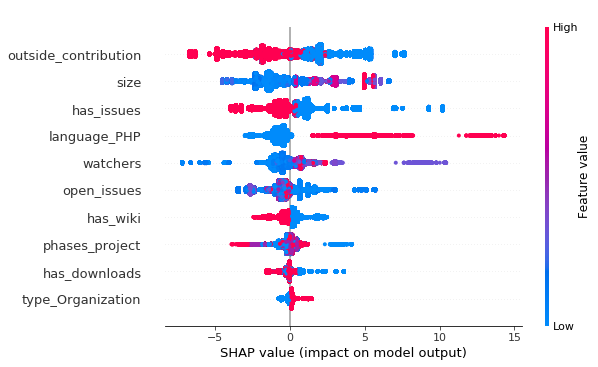

In [21]:
shap.summary_plot(shap_values, X, max_display=10)

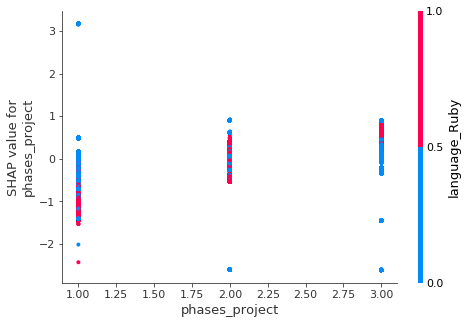

In [51]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("phases_project", shap_values, X)

In [52]:
# visualize the training set predictions
shap.initjs()
shap_values = explainer.shap_values(X.iloc[0:10000,:])
shap.force_plot(explainer.expected_value, shap_values, X.iloc[0:10000,:])

/usr/local/lib/python3.6/dist-packages/shap/plots/force.py:145: UserWarning: shap.force_plot is slow for many thousands of rows, try subsampling your data.
  warnings.warn("shap.force_plot is slow for many thousands of rows, try subsampling your data.")
